In [59]:
using SparseArrays
using LinearAlgebra
using SpecialFunctions  # for besselj
using Arpack  # for eigs on sparse matrices
using Statistics
using Random
using DelimitedFiles
using NPZ
using ExpmV

using SparseArrays

function Hamiltonian(L)
    Jx_list = ones(Float64, L)
    Jy_list = ones(Float64, L)
    Jz_list = ones(Float64, L)

    # set the last element to what you want
    Jx_list[end] = 1e-5
    Jy_list[end] = 1e-5
    Jz_list[end] = 1e-5

    delta = 0.5

    # Define Pauli matrices as complex sparse matrices
    id = sparse(ComplexF64[1 0; 0 1])
    sx = sparse(ComplexF64[0 1; 1 0])
    sy = sparse(ComplexF64[0 -im; im 0])
    sz = sparse(ComplexF64[1 0; 0 -1])


    # Preallocate vectors of operators with correct type
    sx_list = Vector{SparseMatrixCSC{ComplexF64, Int}}(undef, L)
    sy_list = Vector{SparseMatrixCSC{ComplexF64, Int}}(undef, L)
    sz_list = Vector{SparseMatrixCSC{ComplexF64, Int}}(undef, L)

    for i_site in 1:L
        x_ops = fill(id, L)
        y_ops = fill(id, L)
        z_ops = fill(id, L)
        x_ops[i_site] = sx
        y_ops[i_site] = sy
        z_ops[i_site] = sz

        # Build the full operator by tensoring
        X = x_ops[1]
        Y = y_ops[1]
        Z = z_ops[1]
        for j in 2:L
            X = kron(X, x_ops[j])
            Y = kron(Y, y_ops[j])
            Z = kron(Z, z_ops[j])
        end

        sx_list[i_site] = X
        sy_list[i_site] = Y
        sz_list[i_site] = Z
    end

    dim = 2^L
    H = spzeros(ComplexF64, dim, dim)

    for i in 1:L-1
        ip1 = (i + 1)  # Open boundary
        H -= Jx_list[i] * (sx_list[i] * sx_list[ip1])
        H -= Jy_list[i] * (sy_list[i] * sy_list[ip1])
        H -= (Jz_list[i]) * (sz_list[i] * sz_list[ip1])
    end

    return H, sx_list, sz_list
end


function ck(Nc, a, t)
    k = 0:Nc-1
    return (-im) .^ k .* besselj.(k, a * t)
end

function Time_evo(psi, Nc, Ht, a, b, t)
    c = ck(Nc, a, t)
    psi_km0 = Ht * psi
    psi_km1 = psi
    psi_t = c[1] * psi_km1 + 2 * c[2] * psi_km0  # Julia is 1-indexed

    for k in 3:Nc
        psi_k = 2 * Ht * psi_km0 - psi_km1
        psi_t += 2 * c[k] * psi_k
        psi_km1 = psi_km0
        psi_km0 = psi_k
    end

    return exp(-im * b * t) * psi_t
end

function H_twi(L)
    H, sx_list, sz_list = Hamiltonian(L)
    GS, _ = eigs(H; nev=1, which=:SR, ritzvec=false)  # smallest eigenvalue
    SS, _ = eigs(H; nev=1, which=:LR, ritzvec=false)  # largest eigenvalue
    a = (SS[1] - GS[1]) / 2
    b = (SS[1] + GS[1]) / 2
    dim = 2^L
    Ht = (H - b * sparse(I, dim, dim)) / a
    return Ht, a, b, sx_list, sz_list
end

function calculate_entropy(psi::Vector{ComplexF64}, L::Int, subsystem_sites::Vector{Int})
    psi = psi / norm(psi)

    # Reshape the state vector into a tensor of shape (2, 2, ..., 2) with L indices
    psi_tensor = reshape(psi, ntuple(i -> 2, L))

    # Sort the subsystem sites and determine environment sites
    subsystem_sites = sort(subsystem_sites)
    all_sites = collect(1:L)
    environment_sites = setdiff(all_sites, subsystem_sites)

    # Permute the tensor to bring subsystem indices to the front
    permute_order = vcat(subsystem_sites, environment_sites)
    permuted_tensor = permutedims(psi_tensor, permute_order)

    # Reshape into a matrix suitable for SVD
    dim_subsystem = 2^length(subsystem_sites)
    dim_environment = 2^(L - length(subsystem_sites))
    psi_matrix = reshape(permuted_tensor, dim_subsystem, dim_environment)

    # Perform SVD
    s = svdvals(psi_matrix)

    # Compute the entropy
    s_squared = s .^ 2
    s_squared ./= sum(s_squared)  # Normalize
    s_squared_nonzero = s_squared[s_squared .> 1e-15]
    entropy = -sum(s_squared_nonzero .* log.(s_squared_nonzero))

    return entropy
end

function I3(psi::Vector{ComplexF64})
    L = Int(round(log2(length(psi))))

    A = collect(1:(L ÷ 4))
    B = collect((L ÷ 4) + 1 : (L ÷ 2))
    C = collect((L ÷ 2) + 1 : (3L ÷ 4))
    D = collect((3L ÷ 4) + 1 : L)

    AB = vcat(A, B)
    BC = vcat(B, C)
    AC = vcat(A, C)

    SA = calculate_entropy(psi, L, A)
    SB = calculate_entropy(psi, L, B)
    SC = calculate_entropy(psi, L, C)
    SABC = calculate_entropy(psi, L, D)
    SAB = calculate_entropy(psi, L, AB)
    SAC = calculate_entropy(psi, L, AC)
    SBC = calculate_entropy(psi, L, BC)

    return SA + SB + SC + SABC - SAB - SAC - SBC
end

function random_product_state(L::Int)
    product_state = ComplexF64[1.0]  # Start with scalar 1 as base state

    for _ in 1:L
        θ = rand() * π        # Polar angle
        ϕ = rand() * 2π       # Azimuthal angle

        α = cos(θ / 2)                # Coefficient for |0⟩
        β = sin(θ / 2) * cis(ϕ)       # Coefficient for |1⟩, using cis(ϕ) = exp(iϕ)

        temp_state = ComplexF64[α, β]

        product_state = kron(product_state, temp_state)
    end

    return product_state / norm(product_state)
end

function Entropy_t(L::Int, T::Float64, dt::Float64, p::Float64, Nc::Int, direction::String, shot::Int)
    Random.seed!(shot)  # Set random seed
    #s_t = random_product_state(L)
    s_t = neel_spinhalf(L) ## Neel state
    S_list = Float64[]

    # Define Hamiltonian and local observables
    Ht, a, b, sx_list, sz_list = H_twi(L)
    
    if direction == "X"
    sm_list = sx_list
    elseif direction == "Z"
        sm_list = sz_list
    else
        error("Invalid direction: $direction. Choose \"X\" or \"Z\".")
    end


    steps = Int(floor(T / dt))

    for _ in 1:steps
        push!(S_list, calculate_entropy(s_t, L, collect(1:L-1)))
        #push!(S_list, I3(s_t))

        # Time evolution
        #s_t = time_evolution(s_t, dt, L, shot)
        s_t = Time_evo(s_t, Nc, Ht, a, b, dt)
        s_t ./= sqrt(real(s_t' * s_t))  # Normalize

        # Measurements
        if p != 0
            for l in 1:L
                x = rand()
                if x < p
                    m_op = sm_list[l]
                    p_m = 0.5 + 0.5 * real(s_t' * (m_op * s_t))
                    if rand() < p_m
                        s_t = (s_t + m_op * s_t) / (2 * sqrt(p_m))
                    else
                        s_t = (s_t - m_op * s_t) / (2 * sqrt(1 - p_m))
                    end
                end
            end
        end
    end

    # Save result to disk
    filename = "L$(L),T$(T),dt$(dt),p$(p),dir$(direction),s$(shot).npy"
    npzwrite(filename, S_list)

    return S_list
end

function time_evolution(ψ::Vector{ComplexF64}, dt::Float64, L, shot::Int)
    Random.seed!(shot)  # Set random seed for reproducibility
    ψ /= norm(ψ)
    H, _, _ = Hamiltonian(L)
    ψ_new = expmv(-im * dt, H, ψ)

    # Normalize the state
    ψ_new /= norm(ψ_new)
    
    return ψ_new
end

# Define spin-1/2 basis vectors
function spinhalf_vector(state::String)
    if state == "Up"
        return [1.0, 0.0]
    elseif state == "Dn"
        return [0.0, 1.0]
    else
        error("State must be \"Up\" or \"Dn\"")
    end
end

function neel_spinhalf(N::Int)
    # Construct the Néel pattern: Up, Dn, Up, Dn...
    neel_state = [isodd(j) ? "Up" : "Dn" for j in 1:N]
    
    # Start with first spin
    psi = spinhalf_vector(neel_state[1])
    
    # Build the full tensor product
    for j in 2:N
        psi = kron(psi, spinhalf_vector(neel_state[j]))
    end
    
    # Convert to complex vector
    psi_complex = ComplexF64.(psi)
    
    return psi_complex
end

function entropy_evol(L, T, dt)
    s_t = neel_spinhalf(L) ## Neel state
    S_list = Float64[]
    
    steps = Int(floor(T / dt))

    for _ in 1:steps
        push!(S_list, calculate_entropy(s_t, L, collect(1:L-1)))
        #push!(S_list, I3(s_t))

        # Time evolution
        s_t = time_evolution(s_t, dt, L, 0)
    end
    filename = "L$(L),T$(T),dt$(dt).npy"
    npzwrite(filename, S_list)

    return S_list
end

entropy_evol (generic function with 3 methods)

In [ ]:
entropy_evol(8, 100.0, 0.01)

100-element Vector{Float64}:
 -0.0
  0.6853209578911463
  0.677733834291955
  0.6746555096418432
  0.6931030424011819
  0.6858406854241956
  0.5902779484999399
  0.6571491816204857
  0.620672360973694
  0.6775667146972932
  ⋮
  0.6922015515265119
  0.6528855612923564
  0.6817540232077555
  0.6817959201953774
  0.6409228285296293
  0.6912154713622207
  0.6926251556589538
  0.690496423689676
  0.6930987610195607

In [43]:
function entropy_evol(L, t_start, t_end, dt, shot)
    s_t = neel_spinhalf(L)   # initial Néel state
    S_list = Float64[]
    times = collect(t_start:dt:t_end)

    # evolve up to t_start first
    steps_to_start = Int(floor(t_start / dt))
    for _ in 1:steps_to_start
        s_t = time_evolution(s_t, dt, L, 0)
    end

    # now record entropy only between t_start and t_end
    for _ in times
        push!(S_list, calculate_entropy(s_t, L, collect(1:L-1)))
        s_t = time_evolution(s_t, dt, L, 0)
    end

    filename = "L$(L),tstart$(t_start),tend$(t_end),dt$(dt), shot$(shot).npy"
    npzwrite(filename, S_list)

    return S_list
end


function time_evolution(ψ::Vector{ComplexF64}, dt::Float64, L, shot::Int)
    Random.seed!(shot)  # Set random seed for reproducibility
    ψ /= norm(ψ)
    H, _, _ = Hamiltonian(L)
    ψ_new = expmv(-im * dt, H, ψ)

    # Normalize the state
    ψ_new /= norm(ψ_new)

    return ψ_new
end

time_evolution (generic function with 1 method)

In [44]:
data = entropy_evol(10, 0, 100, 0.01, 99)

10001-element Vector{Float64}:
 -0.0
  0.003528599691137854
  0.011886771446504768
  0.023795478663937872
  0.03855414874729254
  0.0556580180863565
  0.07470517293353755
  0.09535784380719975
  0.11732265715570347
  0.14033931985723774
  ⋮
  0.6926990821245547
  0.6923712439995093
  0.691965569468423
  0.6914899948226922
  0.6909530450160897
  0.6903637289070357
  0.689731431022532
  0.6890658009998902
  0.6883766418815824

In [46]:
data1 = entropy_evol(10, 0, 100, 0.01, 990)

10001-element Vector{Float64}:
 -0.0
  0.003528599691137854
  0.011886771446504768
  0.023795478663937872
  0.03855414874729254
  0.0556580180863565
  0.07470517293353755
  0.09535784380719975
  0.11732265715570347
  0.14033931985723774
  ⋮
  0.6926990821245547
  0.6923712439995093
  0.691965569468423
  0.6914899948226922
  0.6909530450160897
  0.6903637289070357
  0.689731431022532
  0.6890658009998902
  0.6883766418815824

In [47]:
data == data1

true

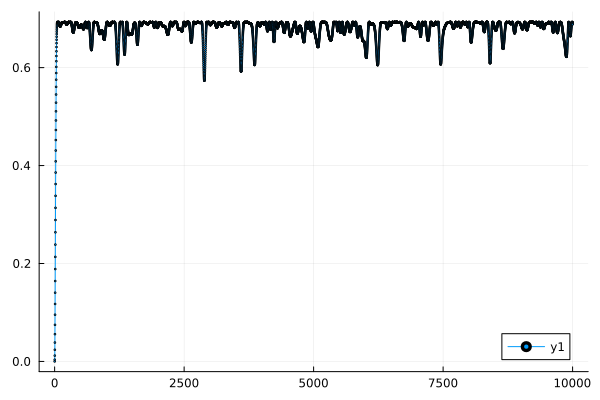

In [45]:
plot(data, markershape=:circle, markersize=1)

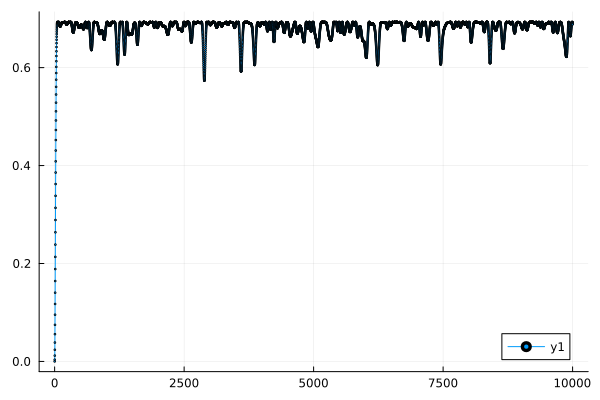

In [29]:
plot(data, markershape=:circle, markersize=1)

In [30]:
function entropy_evol(L, t_start, t_end, dt; n_points=100)
    s_t = neel_spinhalf(L)   # initial Néel state
    S_list = Float64[]

    # choose sampling times (like your U_t example, evenly spaced)
    times = range(t_start, t_end; length=n_points)

    H, _, _ = Hamiltonian(L)   # diagonalize once if needed

    for t in times
        # evolve state directly to time t
        U_tψ = expmv(-im * t, H, s_t)   # evolution from 0 → t
        U_tψ /= norm(U_tψ)
        push!(S_list, calculate_entropy(U_tψ, L, collect(1:L-1)))
    end

    filename = "L$(L),tstart$(t_start),tend$(t_end),dt$(dt),npoints$(n_points).npy"
    npzwrite(filename, S_list)

    return S_list
end

entropy_evol (generic function with 2 methods)

In [34]:
data = entropy_evol(10, 0, 40, 10000)

100-element Vector{Float64}:
 -0.0
  0.6749333636733239
  0.6927253860183957
  0.6872742404110705
  0.6925592044358676
  0.6927895067348206
  0.6888933798200225
  0.6927555554978775
  0.6903911618513365
  0.6722756468021855
  ⋮
  0.6929910172581095
  0.6931466381462954
  0.6905998961562347
  0.6883412042780013
  0.640288074384723
  0.6339107470007063
  0.6916243471918992
  0.6849182695228095
  0.6922979841590691

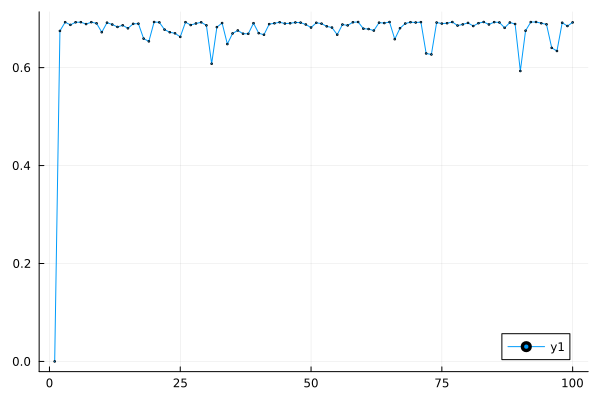

In [42]:
plot(data, markershape=:circle, markersize=1)

In [50]:
data3 = Entropy_t(10, 100.0, 0.01, 0.0, 400, "Z", 99)

10000-element Vector{Float64}:
 -0.0
  0.003528599691137742
  0.011886771446504768
  0.023795478663937872
  0.03855414874729254
  0.05565801808635653
  0.07470517293353755
  0.09535784380719978
  0.1173226571557035
  0.1403393198572377
  ⋮
  0.6929418363658321
  0.6926990821245546
  0.6923712439995093
  0.691965569468423
  0.6914899948226922
  0.6909530450160896
  0.6903637289070358
  0.689731431022532
  0.6890658009998903

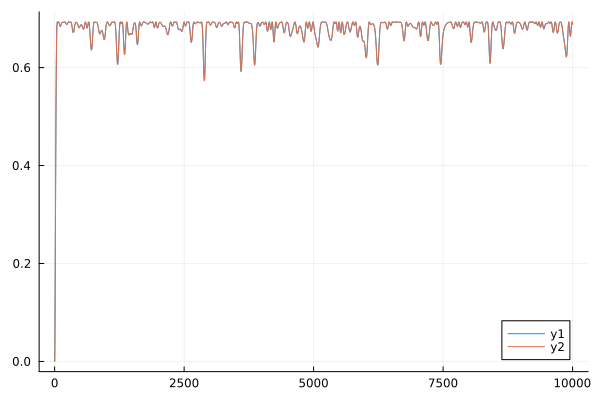

In [54]:
plot(data3)
plot!(data)

In [57]:
diff = data3-data1[1:10000]

10000-element Vector{Float64}:
  0.0
 -1.1188966420050406e-16
  0.0
  0.0
  0.0
  2.7755575615628914e-17
  0.0
  2.7755575615628914e-17
  2.7755575615628914e-17
 -5.551115123125783e-17
  ⋮
  0.0
 -1.1102230246251565e-16
  0.0
  0.0
  0.0
 -1.1102230246251565e-16
  1.1102230246251565e-16
  0.0
  1.1102230246251565e-16

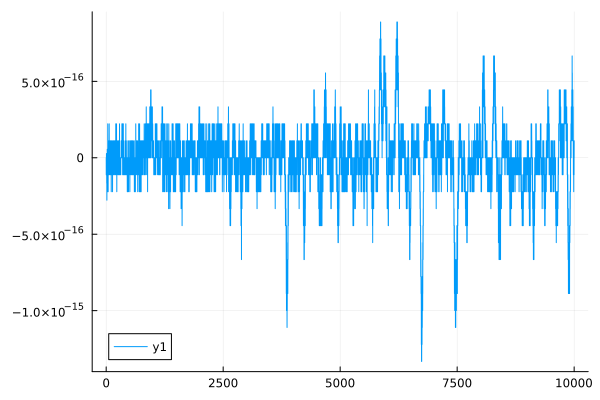

In [58]:
plot(diff)

In [60]:
data_small_coupling = Entropy_t(10, 100.0, 0.01, 0.0, 400, "Z", 99)

10000-element Vector{Float64}:
 -0.0
  0.0035285996911377437
  0.011886771446504771
  0.023795478663937882
  0.03855414874729254
  0.055658018086356474
  0.07470517293353754
  0.09535784380719972
  0.11732265715570345
  0.14033931985723752
  ⋮
  0.6929418363658317
  0.6926990821245541
  0.6923712439995087
  0.6919655694684221
  0.6914899948226912
  0.6909530450160885
  0.6903637289070345
  0.6897314310225304
  0.6890658009998885

In [62]:
 
 L = 10
 Jx_list = ones(Float64, L)
    Jy_list = ones(Float64, L)
    Jz_list = ones(Float64, L)

    # set the last element to what you want
    Jx_list[end] = 1e-5
    Jy_list[end] = 1e-5
    Jz_list[end] = 1e-5

1.0e-5

In [64]:
Jz_list

10-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0e-5

In [ ]:
using SparseArrays
using LinearAlgebra
using SpecialFunctions  # for besselj
using Arpack  # for eigs on sparse matrices
using Statistics
using Random
using DelimitedFiles
using NPZ
using ExpmV

using SparseArrays

function Hamiltonian(L)
    """
    Jx_list = ones(Float64, L)
    Jy_list = ones(Float64, L)
    Jz_list = ones(Float64, L)

    
    # set the last element to what you want
    Jx_list[end] = 1e-5
    Jy_list[end] = 1e-5
    Jz_list[end] = 1e-5
    """

    #delta = 0.5

    # Define Pauli matrices as complex sparse matrices
    id = sparse(ComplexF64[1 0; 0 1])
    sx = sparse(ComplexF64[0 1; 1 0])
    sy = sparse(ComplexF64[0 -im; im 0])
    sz = sparse(ComplexF64[1 0; 0 -1])


    # Preallocate vectors of operators with correct type
    sx_list = Vector{SparseMatrixCSC{ComplexF64, Int}}(undef, L)
    sy_list = Vector{SparseMatrixCSC{ComplexF64, Int}}(undef, L)
    sz_list = Vector{SparseMatrixCSC{ComplexF64, Int}}(undef, L)

    for i_site in 1:L
        x_ops = fill(id, L)
        y_ops = fill(id, L)
        z_ops = fill(id, L)
        x_ops[i_site] = sx
        y_ops[i_site] = sy
        z_ops[i_site] = sz

        # Build the full operator by tensoring
        X = x_ops[1]
        Y = y_ops[1]
        Z = z_ops[1]
        for j in 2:L
            X = kron(X, x_ops[j])
            Y = kron(Y, y_ops[j])
            Z = kron(Z, z_ops[j])
        end

        sx_list[i_site] = X
        sy_list[i_site] = Y
        sz_list[i_site] = Z
    end

    """
    dim = 2^L
    H = spzeros(ComplexF64, dim, dim)

    for i in 1:L-1
        ip1 = (i + 1)  # Open boundary
        H -= Jx_list[i] * (sx_list[i] * sx_list[ip1])
        H -= Jy_list[i] * (sy_list[i] * sy_list[ip1])
        H -= (Jz_list[i]) * (sz_list[i] * sz_list[ip1])
    end
    """

    return sx_list, sz_list
end

"""
function ck(Nc, a, t)
    k = 0:Nc-1
    return (-im) .^ k .* besselj.(k, a * t)
end

function Time_evo(psi, Nc, Ht, a, b, t)
    c = ck(Nc, a, t)
    psi_km0 = Ht * psi
    psi_km1 = psi
    psi_t = c[1] * psi_km1 + 2 * c[2] * psi_km0  # Julia is 1-indexed

    for k in 3:Nc
        psi_k = 2 * Ht * psi_km0 - psi_km1
        psi_t += 2 * c[k] * psi_k
        psi_km1 = psi_km0
        psi_km0 = psi_k
    end

    return exp(-im * b * t) * psi_t
end

function H_twi(L)
    H, sx_list, sz_list = Hamiltonian(L)
    GS, _ = eigs(H; nev=1, which=:SR, ritzvec=false)  # smallest eigenvalue
    SS, _ = eigs(H; nev=1, which=:LR, ritzvec=false)  # largest eigenvalue
    a = (SS[1] - GS[1]) / 2
    b = (SS[1] + GS[1]) / 2
    dim = 2^L
    Ht = (H - b * sparse(I, dim, dim)) / a
    return Ht, a, b, sx_list, sz_list
end
"""

function calculate_entropy(psi::Vector{ComplexF64}, L::Int, subsystem_sites::Vector{Int})
    psi = psi / norm(psi)

    # Reshape the state vector into a tensor of shape (2, 2, ..., 2) with L indices
    psi_tensor = reshape(psi, ntuple(i -> 2, L))

    # Sort the subsystem sites and determine environment sites
    subsystem_sites = sort(subsystem_sites)
    all_sites = collect(1:L)
    environment_sites = setdiff(all_sites, subsystem_sites)

    # Permute the tensor to bring subsystem indices to the front
    permute_order = vcat(subsystem_sites, environment_sites)
    permuted_tensor = permutedims(psi_tensor, permute_order)

    # Reshape into a matrix suitable for SVD
    dim_subsystem = 2^length(subsystem_sites)
    dim_environment = 2^(L - length(subsystem_sites))
    psi_matrix = reshape(permuted_tensor, dim_subsystem, dim_environment)

    # Perform SVD
    s = svdvals(psi_matrix)

    # Compute the entropy
    s_squared = s .^ 2
    s_squared ./= sum(s_squared)  # Normalize
    s_squared_nonzero = s_squared[s_squared .> 1e-15]
    entropy = -sum(s_squared_nonzero .* log.(s_squared_nonzero))

    return entropy
end

function I3(psi::Vector{ComplexF64})
    L = Int(round(log2(length(psi))))

    A = collect(1:(L ÷ 4))
    B = collect((L ÷ 4) + 1 : (L ÷ 2))
    C = collect((L ÷ 2) + 1 : (3L ÷ 4))
    D = collect((3L ÷ 4) + 1 : L)

    AB = vcat(A, B)
    BC = vcat(B, C)
    AC = vcat(A, C)

    SA = calculate_entropy(psi, L, A)
    SB = calculate_entropy(psi, L, B)
    SC = calculate_entropy(psi, L, C)
    SABC = calculate_entropy(psi, L, D)
    SAB = calculate_entropy(psi, L, AB)
    SAC = calculate_entropy(psi, L, AC)
    SBC = calculate_entropy(psi, L, BC)

    return SA + SB + SC + SABC - SAB - SAC - SBC
end

function random_product_state(L::Int)
    product_state = ComplexF64[1.0]  # Start with scalar 1 as base state

    for _ in 1:L
        θ = rand() * π        # Polar angle
        ϕ = rand() * 2π       # Azimuthal angle

        α = cos(θ / 2)                # Coefficient for |0⟩
        β = sin(θ / 2) * cis(ϕ)       # Coefficient for |1⟩, using cis(ϕ) = exp(iϕ)

        temp_state = ComplexF64[α, β]

        product_state = kron(product_state, temp_state)
    end

    return product_state / norm(product_state)
end

function Entropy_t(L::Int, T::Float64, dt::Float64, p::Float64, Nc::Int, direction::String, shot::Int)
    Random.seed!(shot)  # Set random seed
    s_t = random_product_state(L)
    #s_t = neel_spinhalf(L) ## Neel state
    S_list = Float64[]

    # Define Hamiltonian and local observables
    #Ht, a, b, sx_list, sz_list = H_twi(L)
    
    sx_list, sz_list = Hamiltonian(L)

    if direction == "X"
    sm_list = sx_list
    elseif direction == "Z"
        sm_list = sz_list
    else
        error("Invalid direction: $direction. Choose \"X\" or \"Z\".")
    end


    steps = Int(floor(T / dt))

    for _ in 1:steps
        #push!(S_list, calculate_entropy(s_t, L, collect(1:L-1)))
        #push!(S_list, calculate_entropy(s_t, L, collect(1:L÷2)))
        push!(S_list, I3(s_t))

        # Time evolution
        #s_t = time_evolution(s_t, dt, L, shot)
        #s_t = Time_evo(s_t, Nc, Ht, a, b, dt)
        s_t ./= sqrt(real(s_t' * s_t))  # Normalize

        # Measurements
        if p != 0
            for l in 1:L
                x = rand()
                if x < p
                    m_op = sm_list[l]
                    p_m = 0.5 + 0.5 * real(s_t' * (m_op * s_t))
                    if rand() < p_m
                        s_t = (s_t + m_op * s_t) / (2 * sqrt(p_m))
                    else
                        s_t = (s_t - m_op * s_t) / (2 * sqrt(1 - p_m))
                    end
                end
            end
        end
    end

    # Save result to disk
    filename = "L$(L),T$(T),dt$(dt),p$(p),dir$(direction),s$(shot).npy"
    npzwrite(filename, S_list)

    return S_list
end

function time_evolution(ψ::Vector{ComplexF64}, dt::Float64, L, shot::Int)
    Random.seed!(shot)  # Set random seed for reproducibility
    ψ /= norm(ψ)
    H, _, _ = Hamiltonian(L)
    ψ_new = expmv(-im * dt, H, ψ)

    # Normalize the state
    ψ_new /= norm(ψ_new)
    
    return ψ_new
end

# Define spin-1/2 basis vectors
function spinhalf_vector(state::String)
    if state == "Up"
        return [1.0, 0.0]
    elseif state == "Dn"
        return [0.0, 1.0]
    else
        error("State must be \"Up\" or \"Dn\"")
    end
end

function neel_spinhalf(N::Int)
    # Construct the Néel pattern: Up, Dn, Up, Dn...
    neel_state = [isodd(j) ? "Up" : "Dn" for j in 1:N]
    
    # Start with first spin
    psi = spinhalf_vector(neel_state[1])
    
    # Build the full tensor product
    for j in 2:N
        psi = kron(psi, spinhalf_vector(neel_state[j]))
    end
    
    # Convert to complex vector
    psi_complex = ComplexF64.(psi)
    
    return psi_complex
end

function entropy_evol(L, T, dt)
    s_t = neel_spinhalf(L) ## Neel state
    S_list = Float64[]
    
    steps = Int(floor(T / dt))

    for _ in 1:steps
        push!(S_list, calculate_entropy(s_t, L, collect(1:L-1)))
        #push!(S_list, I3(s_t))

        # Time evolution
        s_t = time_evolution(s_t, dt, L, 0)
    end
    filename = "L$(L),T$(T),dt$(dt).npy"
    npzwrite(filename, S_list)

    return S_list
end

function odd_layer(L::Int, dt::Float64)
    id, sx, sy, sz, sp, sm, sz2 = get_spin1_operators()
    U = two_qubit_unitary(1, dt)
    for i in 3:2:L-1
        U = kron(U, two_qubit_unitary(i, dt))
    end
    if isodd(L)
        U = kron(U, id)   # pad last site if odd number of spins
    end
    return U
end

function even_layer(L::Int, dt::Float64)
    id, sx, sy, sz, sp, sm, sz2 = get_spin1_operators()
    U = id                          # start with a free spin at site 1
    for i in 2:2:L-1
        U = kron(U, two_qubit_unitary(i, dt))
    end
    if isodd(L)
        # if L is even, we’ve already used up all spins
        return U
    else
        # if L is odd, pad last site
        return kron(U, id)
    end
end

entropy_evol (generic function with 3 methods)

In [66]:
Entropy_t(10, 100.0, 0.01, 0.0, 400, "Z", 99)

10000-element Vector{Float64}:
 -0.0
  0.003527870745736923
  0.011877226863886576
  0.023753633132314392
  0.03843696804912405
  0.05540165590851547
  0.07422607132266544
  0.09455588717803762
  0.11608611530942785
  0.13855131434314522
  ⋮
  2.1300430677987667
  2.127422998704912
  2.125000700753851
  2.1228011532131332
  2.1208401931949314
  2.1191236528376467
  2.117647393795349
  2.116398492993977
  2.1153574423799753

In [67]:
data = npzread("/Users/uditvarma/Documents/entanglement-dynamics/L10,T100.0,dt0.01,p0.0,dirZ,s99.npy")

10000-element Vector{Float64}:
 -0.0
  0.003527870745736923
  0.011877226863886576
  0.023753633132314392
  0.03843696804912405
  0.05540165590851547
  0.07422607132266544
  0.09455588717803762
  0.11608611530942785
  0.13855131434314522
  ⋮
  2.1300430677987667
  2.127422998704912
  2.125000700753851
  2.1228011532131332
  2.1208401931949314
  2.1191236528376467
  2.117647393795349
  2.116398492993977
  2.1153574423799753

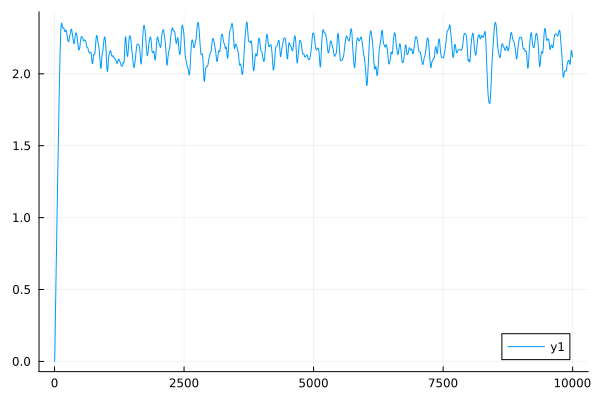

In [68]:
plot(data)

In [ ]:
for L in [8, 9, 10, 11, 12, 13, 14]
    Entropy_t(L, 50.0, 1.0, 0.0, 400, "Z", 0)
end

In [78]:
using NPZ
using Plots

# system sizes
Ls = 8:14

# build filenames for each L
files = [
    "/Users/uditvarma/Documents/entanglement-dynamics/L$(L),T50.0,dt0.01,p0.0,dirZ,s0.npy"
    for L in Ls
]

# load data for each file
data_list = [npzread(f) for f in files]

# time axis (assuming dt=0.01, T=50.0)

# plot all curves in one figure
plot()
for (i, L) in enumerate(Ls)
    plot!(data_list[i], label="L=$L")
end

xlabel!("time")
ylabel!("entropy")
title!("Entanglement dynamics")
savefig("entanglement_dynamics_8_14.png")

display(plot!)


plot! (generic function with 4 methods)

### Two qubit random unitary dynamics

In [ ]:
using LinearAlgebra, Random

"""
Generate a random unitary matrix of size n×n using QR decomposition.
"""
function random_unitary(n::Int)
    A = randn(ComplexF64, n, n)              # random complex matrix
    Q, R = qr(A)                             # QR decomposition
    D = Diagonal(R) ./ abs.(Diagonal(R))     # normalize phases
    D[iszero.(abs.(Diagonal(R)))] .= 1       # avoid NaNs if any zero entries
    return Matrix(Q * D)                     # unitary
end

"""
Apply a two-qubit unitary U (4×4) to a state ψ (4-element vector).
"""
function apply_two_qubit(U::AbstractMatrix{<:Complex}, ψ::AbstractVector{<:Complex})
    size(U) == (4,4) || error("U must be a 4×4 unitary.")
    length(ψ) == 4 || error("ψ must be a 4-element state vector.")
    return U * ψ
end

# Example usage
function main()
    # Define computational basis states
    basis = Matrix(I, 4, 4)  # |00>, |01>, |10>, |11>
    ψ0 = basis[:, 1]         # |00>

    # Option 1: Generate a random two-qubit unitary
    U = random_unitary(4)

    # Option 2: Define your own, e.g. CNOT
    CNOT = [1 0 0 0;
            0 1 0 0;
            0 0 0 1;
            0 0 1 0]

    # Apply the random U
    ψ1 = apply_two_qubit(U, ψ0)

    println("Initial state |00> = ", ψ0)
    println("Final state after random U = ", ψ1)

    # Apply CNOT
    ψ2 = apply_two_qubit(CNOT, ψ0)
    println("Final state after CNOT = ", ψ2)
end


main (generic function with 1 method)

In [86]:
function entropy_vn(ψ::Vector{<:Complex}, L::Int, subsystem::AbstractArray{Int})
    cut = length(subsystem)
    dimA = 2^cut
    dimB = 2^(L - cut)
    ψ_matrix = reshape(ψ, (dimA, dimB))
    svals = svdvals(ψ_matrix)
    S = 0.0
    for s in svals
        if s > 1e-15
            p = abs2(s)
            S -= p * log(p)
        end
    end
    return S
end

entropy_vn (generic function with 1 method)

In [87]:
basis = Matrix(I, 4, 4)  # |00>, |01>, |10>, |11>
ψ0 = basis[:, 1]

4-element Vector{Bool}:
 1
 0
 0
 0

In [90]:
U = random_unitary(4)

4×4 Matrix{ComplexF64}:
   1.02286+0.594087im    0.711008+0.462063im  …  -0.219517+0.737088im
 -0.473282+0.460964im  -0.0872044+0.197294im     -0.452739+1.13772im
  0.958856-0.88078im   -0.0499039+0.309927im     -0.848117+0.643748im
 -0.629752+0.269389im     -1.4494+1.01742im      -0.330755+0.816103im

In [91]:
U * ψ0

4-element Vector{ComplexF64}:
   1.0228597505095385 + 0.5940865441264125im
 -0.47328164896809666 + 0.460964219808782im
   0.9588557855439406 - 0.8807796896438991im
  -0.6297523991780221 + 0.2693885933941068im

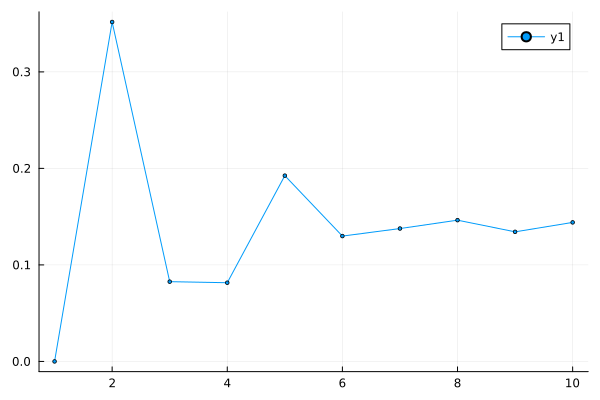

In [137]:
S_list = Float64[]

basis = Matrix{ComplexF64}(I, 4, 4)
ψ0 = basis[:, 1]  # |00⟩ as Complex vector
U = random_unitary(4)

for t in 1:10
    S = entropy_vn(ψ0, 2, [1])
    push!(S_list, S)
    
    ψ0 = U * ψ0
    ψ0 /= norm(ψ0)
    
    #folder = "/Users/uditvarma/Documents/entanglement-dynamics/data_two_qubit"
    #filename = joinpath(folder, "entropy_1_s$(shot).npy")
    #npzwrite(filename, S_list)    
end

plot(S_list, markershape=:circle, markersize=2)

In [98]:
basis = Matrix{ComplexF64}(I, 4, 4)
ψ0 = basis[:, 1]  # |00⟩ as Complex vector

4-element Vector{ComplexF64}:
 1.0 + 0.0im
 0.0 + 0.0im
 0.0 + 0.0im
 0.0 + 0.0im

In [99]:
entropy_vn(ψ0, 2, [1])

0.0

### Bell state unitary

In [107]:
using LinearAlgebra

# Single-qubit Hadamard
H = (1/sqrt(2)) * ComplexF64[1 1; 1 -1]
I2 = Matrix{ComplexF64}(I, 2, 2)

# CNOT in {|00>,|01>,|10>,|11>} order
CNOT = ComplexF64[1 0 0 0;
                  0 1 0 0;
                  0 0 0 1;
                  0 0 1 0]

# Two-qubit unitary: U = CNOT * (H ⊗ I)
U = CNOT * kron(H, I2)

# Sanity checks
basis = Matrix{ComplexF64}(I, 4, 4)
ψ00 = basis[:,1]
ψ = U * ψ00

println("U =")
display(U)
println("U' * U ≈ I ? ", norm(U' * U - I) < 1e-12)
println("U|00> = ", ψ)  # should be [1/√2, 0, 0, 1/√2]


U =
U' * U ≈ I ? true
U|00> = ComplexF64[0.7071067811865475 + 0.0im, 0.0 + 0.0im, 0.0 + 0.0im, 0.7071067811865475 + 0.0im]


4×4 Matrix{ComplexF64}:
 0.707107+0.0im       0.0+0.0im   0.707107+0.0im        0.0+0.0im
      0.0+0.0im  0.707107+0.0im        0.0+0.0im   0.707107+0.0im
      0.0+0.0im  0.707107+0.0im        0.0+0.0im  -0.707107+0.0im
 0.707107+0.0im       0.0+0.0im  -0.707107+0.0im        0.0+0.0im

In [110]:
S_list = Float64[]

H = (1/sqrt(2)) * ComplexF64[1 1; 1 -1]
I2 = Matrix{ComplexF64}(I, 2, 2)

# CNOT in {|00>,|01>,|10>,|11>} order
CNOT = ComplexF64[1 0 0 0;
                  0 1 0 0;
                  0 0 0 1;
                  0 0 1 0]

basis = Matrix{ComplexF64}(I, 4, 4)
ψ0 = basis[:, 1]  # |00⟩ as Complex vector
U = CNOT * kron(H, I2)

for t in 1:10
    S = entropy_vn(ψ0, 2, [1])
    push!(S_list, S)
    
    ψ0 = U * ψ0
    ψ0 /= norm(ψ0)    
end

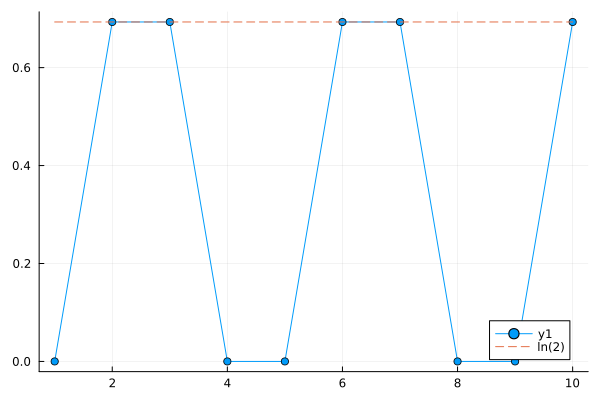

In [113]:
using Plots
plot(S_list, markershape=:circle, markersize=4)
plot!(log(2) * ones(length(S_list)), linestyle=:dash, label="ln(2)")

In [132]:
S_list = Float64[]

basis = Matrix{ComplexF64}(I, 4, 4)
ψ0 = basis[:, 1]  # |00⟩ as Complex vector
U = random_unitary(4)

for t in 1:10
    for shot in 1:1000
        #Random.seed!(shot)
        S = entropy_vn(ψ0, 2, [1])
        push!(S_list, S)
        
        ψ0 = U * ψ0
        ψ0 /= norm(ψ0)
        
        folder = "/Users/uditvarma/Documents/entanglement-dynamics/data_two_qubit"
        filename = joinpath(folder, "entropy_1_s$(shot).npy")
        npzwrite(filename, S_list)    
    end
end

#plot(S_list, markershape=:circle, markersize=2)

In [125]:
using Pkg;
Pkg.add("Glob")

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed Glob ─ v1.3.1
    Updating `~/.julia/environments/v1.11/Project.toml`
  [c27321d9] + Glob v1.3.1
    Updating `~/.julia/environments/v1.11/Manifest.toml`
  [c27321d9] + Glob v1.3.1
Precompiling project...
   1207.6 ms  ✓ Glob
  1 dependency successfully precompiled in 3 seconds. 317 already precompiled.


In [133]:
npzread("/Users/uditvarma/Documents/entanglement-dynamics/data_two_qubit/entropy_1_s89.npy")

9089-element Vector{Float64}:
 0.0
 0.33941514711131265
 0.36012624773004065
 0.40518119922365425
 0.6771952368208799
 0.5432945323536513
 0.3598470479339826
 0.3927497027568263
 0.08219381656460703
 0.06365573112396031
 ⋮
 0.1323236450689919
 0.09577401013669112
 0.17953722797332472
 0.385073571836126
 0.4595761341943396
 0.6348267104222314
 0.6018670170967634
 0.4496820031069875
 0.33180096387347263

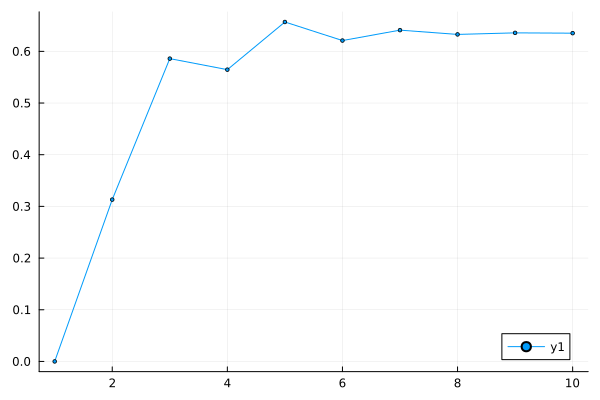

In [140]:
using LinearAlgebra, NPZ

"""
    simulate_entropy(U, ψ0, tmax)

Evolve the initial state ψ0 under unitary U for `tmax` steps,
computing the entanglement entropy at each step.
Returns a vector of entropies.
"""

U = random_unitary(4)
basis = Matrix{ComplexF64}(I, 4, 4)
ψ0 = basis[:, 1]  # |00⟩ as Complex vector

function simulate_entropy(U::AbstractMatrix, ψ0::AbstractVector, tmax::Int)
    S_list = Float64[]
    state = copy(ψ0)

    for t in 1:tmax
        S = entropy_vn(state, 2, [1])   # entanglement entropy
        push!(S_list, S)

        state = U * state
        state /= norm(state)
    end

    return S_list
end

simulate_entropy(U, ψ0, 10)
plot(simulate_entropy(U, ψ0, 10), markershape=:circle, markersize=2)

In [170]:
for shot in 1:5000
    #Random.seed!(shot)
    U = random_unitary(4)
    #U = CNOT * kron(H, I2)
    basis = Matrix{ComplexF64}(I, 4, 4)
    ψ0 = basis[:, 1]  # |00⟩ as Complex vector
    S_list = simulate_entropy(U, ψ0, 10)

    folder = "/Users/uditvarma/Documents/entanglement-dynamics/data_two_qubit"
    filename = joinpath(folder, "entropy_1_s$(shot).npy")
    npzwrite(filename, S_list)    
end

In [171]:
using NPZ, Glob, Statistics

# Folder path
folder = "/Users/uditvarma/Documents/entanglement-dynamics/data_two_qubit/"

# Collect all matching files
files = glob("entropy_1_s*.npy", folder)

# Read all values
values = [npzread(f) for f in files]

# Compute mean
avg_entropy = mean(values)

# Save as .npy
outpath = joinpath(folder, "avg_entropy.npy")
npzwrite(outpath, avg_entropy)

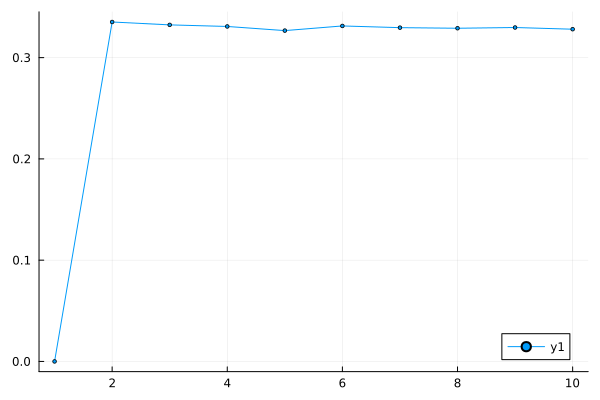

In [166]:
plot(avg_entropy, markershape=:circle, markersize=2)

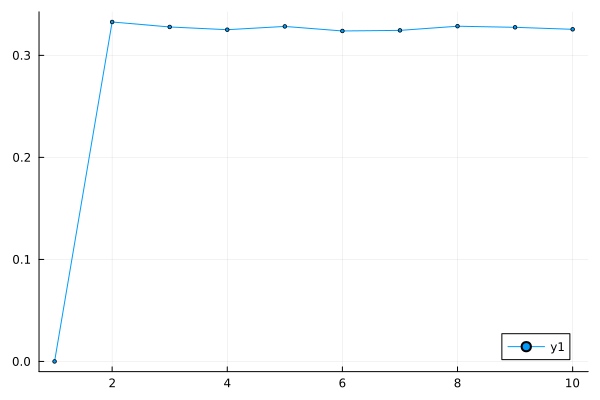

In [172]:
plot(avg_entropy, markershape=:circle, markersize=2)

In [1]:
using SparseArrays
using LinearAlgebra
using SpecialFunctions  # for besselj
using Arpack  # for eigs on sparse matrices
using Statistics
using Random
using DelimitedFiles
using NPZ
using ExpmV

using SparseArrays

In [2]:
function two_qubit_unitary()
    A = randn(ComplexF64, 4, 4)              # random complex matrix
    Q, R = qr(A)                             # QR decomposition
    D = Diagonal(R) ./ abs.(Diagonal(R))     # normalize phases
    D[iszero.(abs.(Diagonal(R)))] .= 1       # avoid NaNs if any zero entries
    return Matrix(Q * D)                     # unitary
end

two_qubit_unitary (generic function with 1 method)

In [9]:
x = two_qubit_unitary()

4×4 Matrix{ComplexF64}:
    1.71557-0.419244im   0.494541-0.329468im   …   0.504171+0.336912im
 -0.0876327+0.436598im    1.03859-0.907364im      0.0554385-1.35079im
  -0.025335-0.216897im  -0.459992-0.0879197im      0.490447+0.00244265im
  -0.502315+0.618671im  -0.388658-1.1724im          1.05613+0.669801im

In [11]:
isunitary(x)

UndefVarError: UndefVarError: `isunitary` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [16]:
using LinearAlgebra, Random

function haar_unitary()
    # Complex Ginibre ensemble (Gaussian random matrix)
    Z = randn(ComplexF64, 4, 4) ./ sqrt(2)
    
    # QR decomposition
    Q, R = qr(Z)
    Q = Matrix(Q)
    
    # Normalize phases (so Q is Haar distributed)
    d = diag(R)
    ph = d ./ abs.(d)
    Q .* ph'
end

haar_unitary (generic function with 1 method)

In [17]:
U = haar_unitary()

4×4 Matrix{ComplexF64}:
 0.0775636+0.709736im   -0.308063+0.247796im  …   0.191913+0.00361669im
 -0.171536+0.427783im    0.529393-0.29901im       0.528333+0.0655038im
  0.414724-0.139175im   0.0563024-0.498489im     0.0537217+0.648543im
    0.2871-0.0635888im  0.0139043+0.471355im       0.44677+0.237975im

In [18]:
U' * U

4×4 Matrix{ComplexF64}:
          1.0+0.0im          …  -1.46891e-16-6.90722e-17im
 -1.66571e-16-5.2532e-17im        -2.988e-17-1.12683e-16im
  3.45391e-17+9.38162e-18im     -2.98502e-17+1.94033e-17im
 -1.46891e-16+6.90722e-17im              1.0+0.0im

In [1]:
include("haar.jl")

haar_unitary (generic function with 1 method)

In [6]:
Entropy_t(10, 100.0, 1.0, 1.0, "Z", 0)

100-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [4]:
data = npzread("/Users/uditvarma/Documents/haar_data/data_i3/L10,T100.0,dt1.0,p0.0,dirZ,s0_i3.npy")

100-element Vector{Float64}:
  0.0
  3.3306690738754696e-16
 -0.07156868650885384
 -0.5665184711061015
 -0.7793290752268285
 -1.0300899727500603
 -1.338998909426972
 -1.5378192846669347
 -1.552992851071696
 -1.6342208527576498
  ⋮
 -1.729028860385963
 -1.7414569972459906
 -1.698911773239666
 -1.7162456123163876
 -1.6978183704131466
 -1.7305451228652324
 -1.7520683138859572
 -1.721820577822482
 -1.7232081005270476

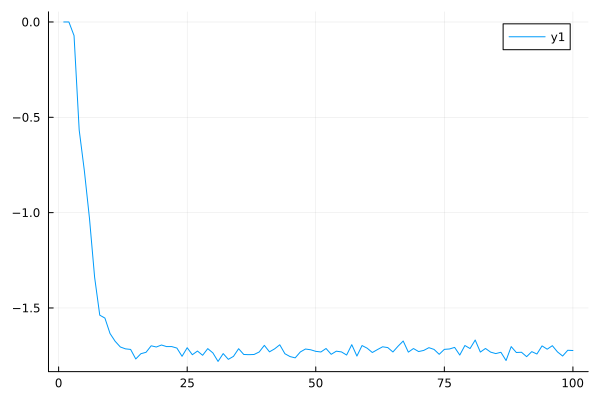

In [5]:
using Plots
plot(data)

In [ ]:
using Distributed
using Base.Threads

# --- setup workers ---
addprocs(11)   # or addprocs(N)
@everywhere using SparseArrays, LinearAlgebra, Arpack, Statistics, Random, DelimitedFiles, NPZ, ExpmV, Dates

# --- load your functions everywhere ---
@everywhere begin
    include("haar.jl")
end

# --- parameters ---
Ls = [6, 7, 9, 10, 11, 12] 
dts = [1.0]
ps = 0.0:0.1:1.0
shots = 1:500

jobs = [(L, float(10L), 1.0, p) for L in Ls for p in ps]  # each job = one (L,T,dt,p)

@everywhere const SHOTS = 1:500   # broadcast shots to workers

# --- hybrid run ---
pmap(jobs) do (L, T, dt, p)
    @threads for shot in SHOTS
        Entropy_t(L, T, dt, p, "Z", shot)
    end
end